# Consistent AI Image Generation

### Project Overview
---
This notebook is part of a multi-part project that compares different approaches to consistent AI image generation.

The methods for consistent AI image generation used are:
- **Method 1:** Image-to-Image Generation Using a Base Image
- **Method 2:** Fine-tuning SD1.5 with similar images until it generates somewhat consistently

You can refer to the [README](https://github.com/angusleung100/AI-Generated-Catgirls-SD) for more background on this project.

### Post Generation Examples
---
This notebook is a supporting file for Part 4 of the Making AI-Generated Catgirls (As a CS grad) series and contains social media post examples generated by the Method 2 trained model and post ideas by the Gemini LLM model.


In [ ]:
# Import prequisites
!pip install diffusers accelerate torch safetensors IPython

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
# Import prerequisites
import os
import torch

from diffusers import StableDiffusionPipeline, DiffusionPipeline, DDIMScheduler, LMSDiscreteScheduler, PNDMScheduler, EulerAncestralDiscreteScheduler, EulerDiscreteScheduler, DPMSolverMultistepScheduler
from diffusers.utils import load_image, make_image_grid
from IPython.display import Image, display
from PIL import Image
from google.colab import userdata, drive

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
# Script Configuration
drive.mount('/content/drive')

base_directory = "/content/drive/My Drive/AI Consistent Generation/"

civitai_token = ""  # Civitai API token

hf_token = userdata.get('hf_token') # Hugging Face auth token read/write

gemini_token = userdata.get('gemini_key') # Hugging Face auth token read/write

Mounted at /content/drive


In [ ]:
# Load Gemini API for image captions
import google.generativeai as genai

genai.configure(api_key=gemini_token)

gemini_model = genai.GenerativeModel(model_name="gemini-1.5-flash")

### Download Textual Inversions
---

In [ ]:
# Bad anatomy
!curl -L -o bad_NegAnatomy.pt https://civitai.com/api/download/models/64063 # https://civitai.com/models/59614/badneganatomy-textual-inversion
!curl -L -o Deep_NegativeV1.pt https://civitai.com/api/download/models/5637 # https://civitai.com/models/4629/deep-negative-v1x
!curl -L -o Bad_Hands4.pt https://civitai.com/api/download/models/20068 # https://civitai.com/models/16993/badhandv4
!curl -L -o Perfect_Asian_Face.pt https://civitai.com/api/download/models/24904 # https://civitai.com/models/20918/perfect-asian-facev1
!curl -L -o Unrealistic_Dream.pt https://civitai.com/api/download/models/77173 # https://civitai.com/models/72437?modelVersionId=77173
!curl -L -o Bad_Dream.pt https://civitai.com/api/download/models/77169 # https://civitai.com/models/72437?modelVersionId=77169

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   488    0   488    0     0   1668      0 --:--:-- --:--:-- --:--:--  1671
100  210k  100  210k    0     0   414k      0 --:--:-- --:--:-- --:--:--  414k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   494    0   494    0     0   3457      0 --:--:-- --:--:-- --:--:--  3478
100  225k  100  225k    0     0   722k      0 --:--:-- --:--:-- --:--:-- 75.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   472    0   472    0     0   2344      0 --:--:-- --:--:-- --:--:--  2348
100 19371  100 19371    0     0  52646      0 --:--:-- --:--:-- --:--:-- 52646
  % Total    % Received % Xferd  Average Speed   Tim

### Load weights from Hugging Face
---

In [ ]:

hf_dreambooth_checkpoint = "angusleung100/astoria-db" # I made mine a public checkpoint but you can use a local checkpoint too

pipeline = DiffusionPipeline.from_pretrained(hf_dreambooth_checkpoint, token=hf_token, torch_dtype=torch.float16)

# Move the pipeline to the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pipeline.to(device)

# Bad anatomy Embeddings
textual_inversions = ['bad_NegAnatomy.pt', 'Deep_NegativeV1.pt', 'Bad_Hands4.pt', 'Perfect_Asian_Face.pt', 'Unrealistic_Dream.pt', 'Bad_Dream.pt']

for ti in textual_inversions:
  pipeline.load_textual_inversion(ti, local_files_only=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

text_encoder/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/641 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


### Generation Config
---

In [ ]:
config = {
  'num_inference_steps': 20,
  'strength': 0.8,
  'guidance_scale': 5,
  'num_images_per_prompt': 5, # Max images per prompt for T4 is around 5-10
  'height': 512,
  'width': 512,
  'seed': 1956570117,
  'scheduler': "DPMSolverMultistepScheduler_karras"
}

torch.manual_seed(config['seed'])

#pre_prompt = """Astoria-Lee, Korean girl, kpop idol, bangs, """

negative_prompt = """watermark, logo, bushy eyebrows, hairy eyebrows, rectangular eyebrows, (worst_quality:2), (low quality:2), (normal quality:2), lowres, normal quality, ((monochrome)), ((grayscale)), pixelated, deformed, ugly, bad-hands-5 easynegative verybadimagenegative_v1.3 UnrealisticDream"""

### Define Reusable Functions
---
Some of the functions from Method 1 are reused because they are trivial and are genuinely helpful in making the code readable. Also some of the functions for generation are reused since... we need to generate images anyways.

In [ ]:
# Set save directory
def create_save_dir(target_directory):

  if not os.path.exists(base_directory+target_directory):  # Make directory if not exists
    os.makedirs(base_directory+target_directory)
    print("Created save directory")
  else:
    print("Directory already exists")

  return target_directory

# Save generation settings
def create_generation_settings_file(file_label):
  try:
    with open(base_directory+"/generation_settings_"+file_label+".txt", "x") as f:
      f.write("Seed: "+str(config['seed'])+"\nPositive Prompt: "+positive_prompt+"\nNegative Prompt: "+negative_prompt+"\n")
      f.write("Base Image: "+str(None)+"\nNum Inference Steps: "+str(config['num_inference_steps'])+"\nStrength: "+str(config['strength'])+"\n")
      f.write("Images Per Batch: "+str(config['num_images_per_prompt'])+"\nNumber of Batches: "+str(batch_count)+"\nTotal Images: "+str(config['num_images_per_prompt']*batch_count)+"\n")
      f.write("Guidance Scale: "+str(config['guidance_scale'])+"\nTextual Inversions Used: "+str(textual_inversions)+"\nScheduler Used: "+str(config['scheduler'])+"\n")

  except:
    with open(base_directory+"/generation_settings_"+file_label+".txt", "w") as f:
      f.write("Seed: "+str(config['seed'])+"\nPositive Prompt: "+positive_prompt+"\nNegative Prompt: "+negative_prompt+"\n")
      f.write("Base Image: "+str(None)+"\nNum Inference Steps: "+str(config['num_inference_steps'])+"\nStrength: "+str(config['strength'])+"\n")
      f.write("Images Per Batch: "+str(config['num_images_per_prompt'])+"\nNumber of Batches: "+str(batch_count)+"\nTotal Images: "+str(config['num_images_per_prompt']*batch_count)+"\n")
      f.write("Guidance Scale: "+str(config['guidance_scale'])+"\nTextual Inversions Used: "+str(textual_inversions)+"\nScheduler Used: "+str(config['scheduler'])+"\n")

  print("Generation settings text file", file_label, "created successfully")

# Generation Function
def generate(config, base_image, positive_prompt, negative_prompt):

  # Load scheduler
  if config['scheduler'] == "DDIMScheduler":
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "LMSDiscreteScheduler":
    pipeline.scheduler = LMSDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "EulerAncestralDiscreteScheduler":
    pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "EulerDiscreteScheduler":
    pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "DPMSolverMultistepScheduler":
    pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "DPMSolverMultistepScheduler_karras":
    pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config, use_karras_sigmas=True)
  else:
    pipeline.scheduler = PNDMScheduler.from_config(pipeline.scheduler.config)

    # Note: By default it is PNDMS scheduler
  return pipeline(prompt=positive_prompt, negative_prompt=negative_prompt, init_image=base_image, width=config['width'], height=config['height'], num_images_per_prompt=config['num_images_per_prompt'], num_inference_steps=config['num_inference_steps'], guidance_scale=config['guidance_scale'])

# Batch Generation Function
def batch_generate(batches_to_generate, save_directory, prompt):

  global img_id # Used as cursor for current image id label

  img_id = 1  # Image ID cursor (Used to generate images and avoid overwriting)

  print("Batch Generation Started")

  print("Total Generated Images For Function Call: ", str(config['num_images_per_prompt']*batches_to_generate))


  # Generate multiple batches

  for i in range(batches_to_generate):  # Batch
    print("Generating Batch ", str(i+1))

    result = generate(config, None, prompt, negative_prompt)

    for img in result.images:

      img.save(base_directory+save_directory+"/"+str(img_id)+".png")  # Naming convention of Character (X).png to comply with Fast Dreambooth Script
      img_id += 1

  print("Batch Generation Complete")

# Create 5 image grid from target directory images
def image_grid_5(image_dir):
  image_names = os.listdir(base_directory+"/"+image_dir)

  number_to_display = 5 # Number of images to display

  img_num = 0

  images_to_display = []

  for img in image_names:

    if img_num == number_to_display:
      break

    if ".txt" in img:
      continue
    else:
      images_to_display.append(Image.open(base_directory+"/"+image_dir+"/"+img))
      img_num += 1

  images_to_display.append(Image.new('RGB', (512, 512), color=(255, 255, 255))) # Add blank image to meet 3x2 grid requirements

  return images_to_display

def caption_image(image_location, prompt):
  img = Image.open(image_location)

  return gemini_model.generate_content(["Write an Instagram caption for this image as a gamer girl cosplayer influencer with this image generation prompt as context: "+prompt, img]).text

## Generate Posts
---
Below are the posts generated by our trained model.

Gemini planned out 4 posts with 2 per week for 2 weeks.

### Week 1 Post 1
---
```
Post 1: High-fashion, dark academia-inspired outfit with witchy accessories
Prompt: "Dark academia fashion, witchy accessories, high fashion, elegant, mysterious, detailed outfit, intricate jewelry, moody lighting, cinematic, art by Artgerm, Alphonse Mucha, trending on Artstation"

```

Directory already exists
Batch Generation Started
Total Generated Images For Function Call:  5
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Batch Generation Complete


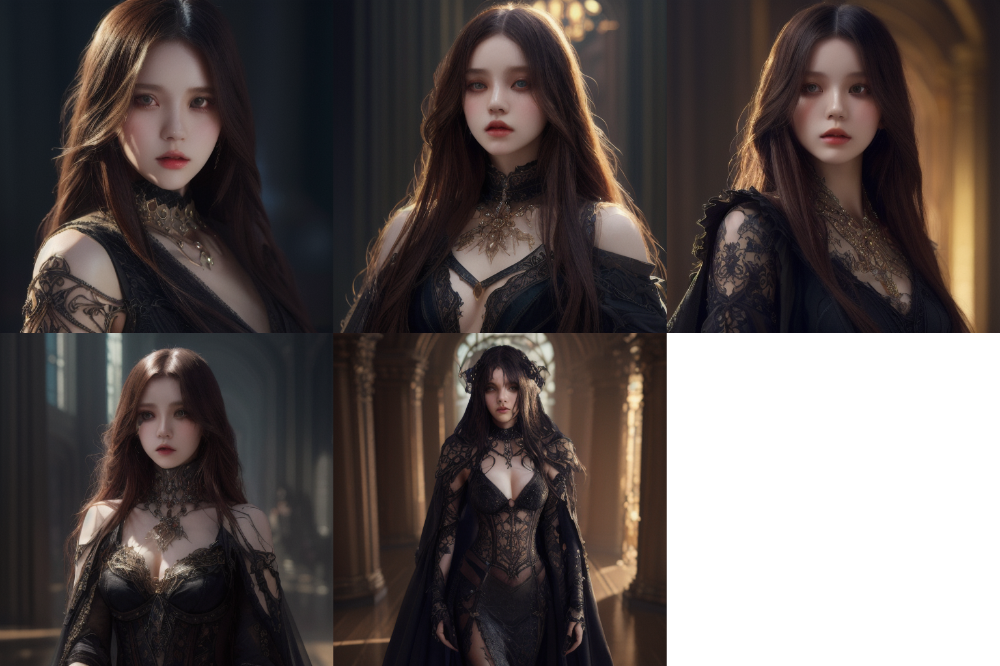

In [ ]:
save_folder = "post-1"
prompt = "Astoria-Lee, Dark academia fashion, witchy accessories, high fashion, elegant, mysterious, detailed outfit, intricate jewelry, moody lighting, cinematic, art by Artgerm, Alphonse Mucha, trending on Artstation"
create_save_dir(save_folder)
batch_generate(1, save_folder, prompt)
make_image_grid(image_grid_5(save_folder), rows=2, cols=3)

In [ ]:
# Caption Post 1
print("Image 1 Caption:", caption_image(base_directory+save_folder+"/"+"1.png", prompt))

Image 1 Caption: ✨  Lost in a world of enchantment, where Art Deco meets dark academia.  ✨ 

This ethereal look was inspired by the legendary artists Artgerm and Alphonse Mucha, and I'm obsessed with how it turned out!  🖤  

What's your favorite detail?  Tell me in the comments! 👇

#artgerm #alphonsemucha #darkacademia #witchy #gamergirl #cosplay #artstation #highfashion #elegant #mystery #cinematic #mood #newpost  



Generations were amazing but let's add cat ears because we are making AI-generated cat girls

Directory already exists
Batch Generation Started
Total Generated Images For Function Call:  5
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Batch Generation Complete


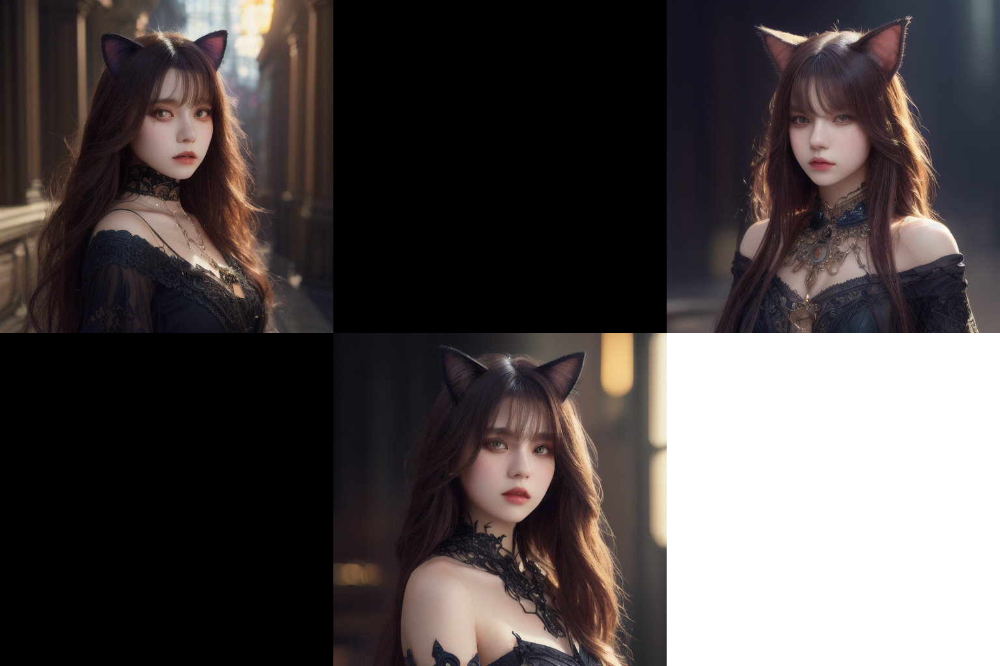

In [ ]:
save_folder = "post-1-a"
prompt = "Astoria-Lee, cat girl ears, Dark academia fashion, witchy accessories, high fashion, elegant, mysterious, detailed outfit, intricate jewelry, moody lighting, cinematic, art by Artgerm, Alphonse Mucha, trending on Artstation"
create_save_dir(save_folder)
batch_generate(1, save_folder, prompt)
make_image_grid(image_grid_5(save_folder), rows=2, cols=3)

### Week 1 Post 2
---
```
Post 2: Detailed look at a custom-made piece of jewelry inspired by a fantasy RPG artifact
Prompt: "Fantasy RPG artifact jewelry, intricate details, precious stones, gold, silver, magical glow, close-up, high resolution, detailed, ornate, cinematic lighting, amateur photography, overexposed, color fringing, low quality camera"

```

Created save directory
Batch Generation Started
Total Generated Images For Function Call:  5
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Batch Generation Complete


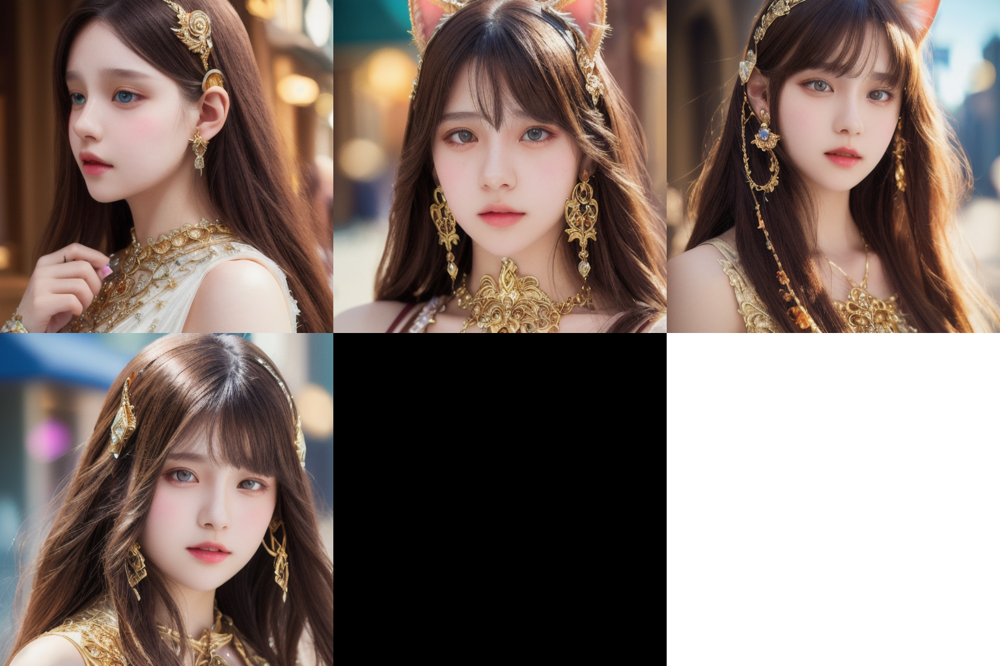

In [ ]:
save_folder = "post-2"
prompt = "Astoria-Lee holding Fantasy RPG artifact jewelry wearing cat ear hair clips, intricate details, precious stones, gold, silver, magical glow, close-up, high resolution, detailed, ornate, cinematic lighting, amateur photography, overexposed, color fringing, low quality camera"
create_save_dir(save_folder)
batch_generate(1, save_folder, prompt)
make_image_grid(image_grid_5(save_folder), rows=2, cols=3)

In [ ]:
# Caption Post 2
print("Image 2 Caption:", caption_image(base_directory+save_folder+"/"+"2.png", prompt))

Image 2 Caption: Leveling up my cosplay game! 🎮✨  This magical artifact necklace is just the thing to help me conquer any dungeon. What do you think? #gamergirl #cosplay #fantasy #rpg #artifact #jewelry #catgirl #magicalgirl #gaming #levelup #cosplaylife #anime #manga #otaku #nerd #gamer 



### Week 2 Post 1
---
```
Post 3: Full outfit inspired by a powerful female character from a fantasy RPG, with a modern twist
Prompt: "Strong female character, fantasy RPG, modern fashion, powerful pose, confident, detailed outfit, urban environment, cinematic lighting, art by Greg Rutkowski, trending on Artstation"

```

For this one I let Stable Diffusion try to be creative with the RPG part but I added in a few cat girl keywords too. I noticed after a few generations that the prompt was a bit weak and had trouble generating without anatomy problems so I asked Gemini to adjust the prompt it further.

After about 8 generations I had to manually adjust the prompt to experiment with getting a better result

Created save directory
Batch Generation Started
Total Generated Images For Function Call:  5
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Batch Generation Complete


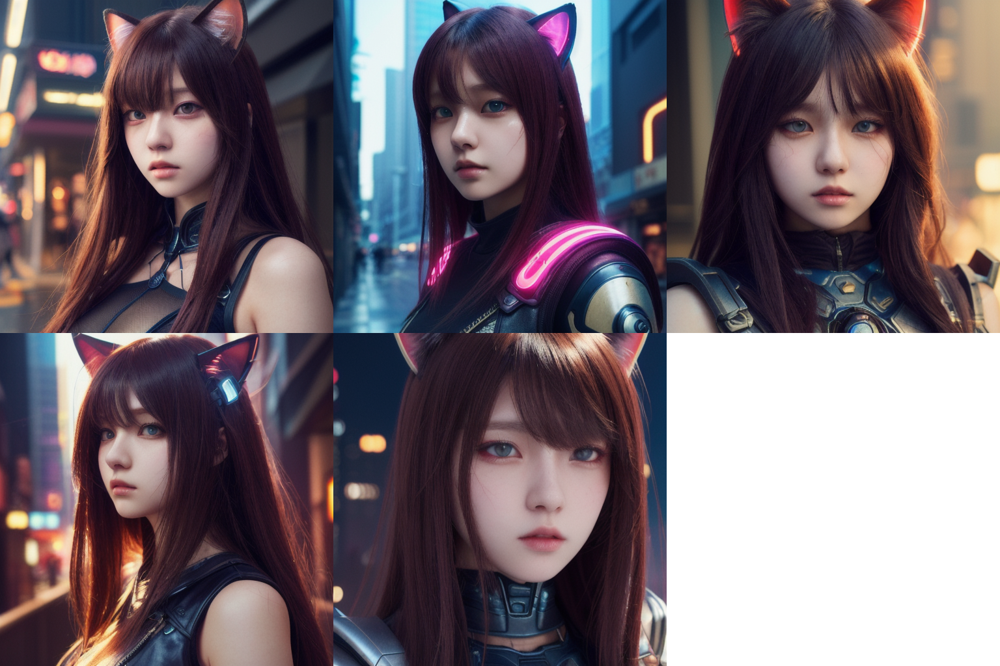

In [ ]:
save_folder = "post-3-a"
prompt = "Astoria-Lee as a cat ear neko girl warrior, close-up shot, fantasy RPG, modern cyberpunk outfit, powerful confident pose, intricate details, cyberpunk setting, cinematic lighting, detailed environment"
create_save_dir(save_folder)
batch_generate(1, save_folder, prompt)
make_image_grid(image_grid_5(save_folder), rows=2, cols=3)

In [ ]:
# Caption Post 3
print("Image 2 Caption:", caption_image(base_directory+save_folder+"/"+"2.png", prompt))

Image 2 Caption: Ready to level up your game! 🎮 This cyberpunk warrior is ready to take on any challenge. What's your favorite game to play? #gamergirl #cosplay #neko #cyberpunk #rpg #gaming #levelup #fantasy #anime #kawaii #gamer #girlpower 



This generation was a weird one because it took a long time to get a decent set of pics. However, I still prefer the post-3 generation before the one above where only the last image was usable. It is shown below with its caption:

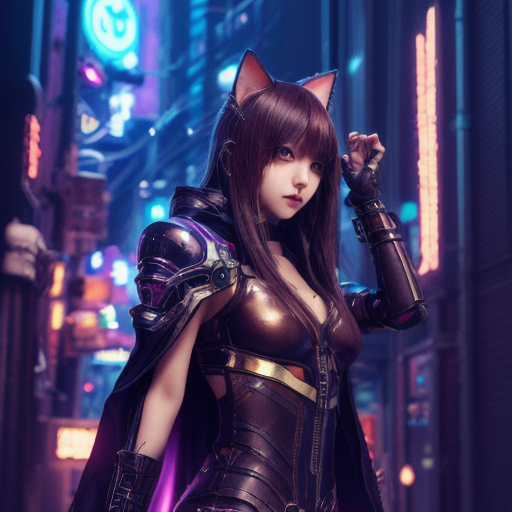

In [ ]:
Image.open(base_directory+"/post-3/5.png")


**Caption:**
Ready to take on the cyberpunk city! ⚔️  This warrior neko girl is ready to fight for justice, one pixelated battle at a time. 😸 #cosplay #cyberpunk #gamergirl #neko #fantasy #rpg #gaming  #astoria_lee

### Week 2 Post 2
---
```
Post 4: Witchy wardrobe essential: styling a black dress for different fantasy RPG looks
Prompt: "Black dress, versatile, multiple fantasy styles, forest, castle, urban, magical, detailed outfits, different accessories, cinematic lighting, art by Craig Mullins, trending on Artstation"

```

This one also had a lot of trouble with the face, so I had Gemini adjust the prompt and then I manually adjusted it myself.

Directory already exists
Batch Generation Started
Total Generated Images For Function Call:  5
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Batch Generation Complete


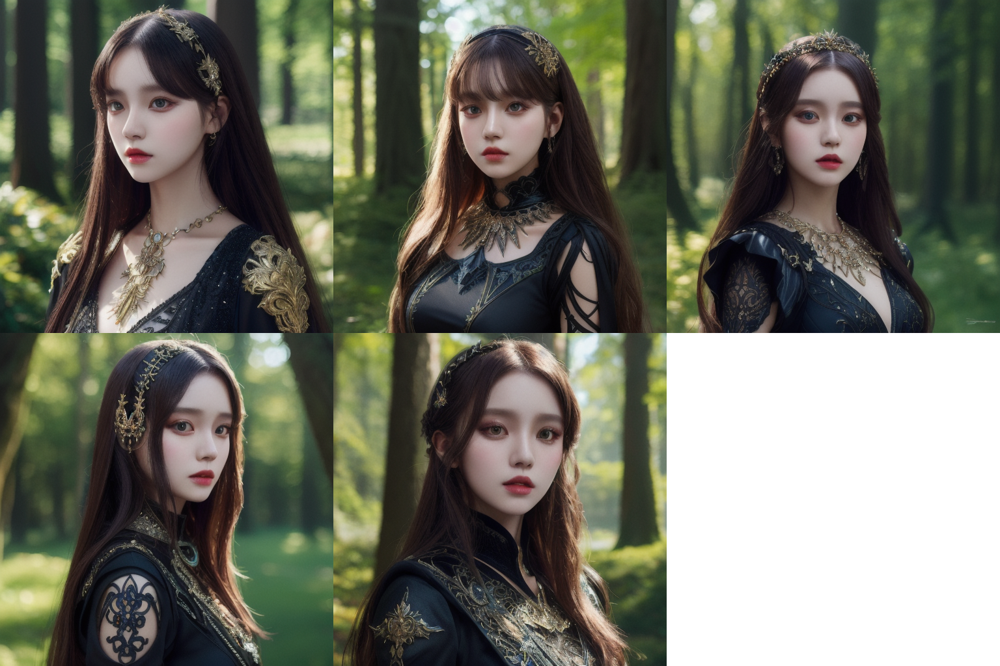

In [ ]:
save_folder = "post-4"
prompt = "Astoria-Lee in a Black dress, close up image, versatile, multiple fantasy styles, forest, castle, urban, magical, detailed outfits, different accessories, cinematic lighting, trending on Artstation"
create_save_dir(save_folder)
batch_generate(1, save_folder, prompt)
make_image_grid(image_grid_5(save_folder), rows=2, cols=3)

In [ ]:
# Caption Post 4
print("Image 2 Caption:", caption_image(base_directory+save_folder+"/"+"1.png", prompt))

Image 2 Caption: Ready to level up my cosplay game! ⚔️  This neko warrior is ready to take on any challenge in the cyberpunk world! What do you think of my latest look? #cosplay #neko #gamergirl #cyberpunk #rpg #fantasy #warrior #astoriacosplay #newlook  🎮  ✨ 



It seems Dreambooth SD for this model's training was better for close up images than full-body or slightly more distanced shots. We finally got some usable photos after several adjustments!

 In the long run, we might have to continue training the model with different shots and angles.

## Summary
---
We used Diffusers + Dreambooth SD 1.5 + Gemini to create our posts and captions. It was moderately successful but it seems the model will need a bit more training for different angles and shots. It did not do so good on distanced shots with full body.

Overall quality of the clothing style was really good but it also felt really AI-generated.

The Gemini image captions were decent, but they always seemed to be very similar and had questions to interact with the viewers. It seemed to also really like to get inspiration from Artstation and some artists for image generations instead of amateur or professional photographers.

## Original Gemini response for post schedule
---
```
	Prompt Ideas
	Note: You can adjust these prompts by adding specific game titles, character names, or fashion styles. Experiment with different art styles, lighting conditions, and camera angles to achieve desired results.
	Post 1: High-fashion, dark academia-inspired outfit with witchy accessories
		• Prompt: "Dark academia fashion, witchy accessories, high fashion, elegant, mysterious, detailed outfit, intricate jewelry, moody lighting, cinematic, art by Artgerm, Alphonse Mucha, trending on Artstation"
	Post 2: Detailed look at a custom-made piece of jewelry inspired by a fantasy RPG artifact
		• Prompt: "Fantasy RPG artifact jewelry, intricate details, precious stones, gold, silver, magical glow, close-up, high resolution, detailed, ornate, cinematic lighting"
	Post 3: Full outfit inspired by a powerful female character from a fantasy RPG, with a modern twist
		• Prompt: "Strong female character, fantasy RPG, modern fashion, powerful pose, confident, detailed outfit, urban environment, cinematic lighting, art by Greg Rutkowski, trending on Artstation"
	Post 4: Witchy wardrobe essential: styling a black dress for different fantasy RPG looks
		• Prompt: "Black dress, versatile, multiple fantasy styles, forest, castle, urban, magical, detailed outfits, different accessories, cinematic lighting, art by Craig Mullins, trending on Artstation"
	Additional Tips
		• Experiment with art styles: Try different art styles like anime, realism, or impressionism to vary your output.
		• Incorporate specific details: Add specific elements like "velvet cloak," "crystal necklace," or "leather boots" to refine the image.
		• Use descriptive language: Be as detailed as possible in your prompts to get the desired results.
		• Leverage negative prompts: Specify what you don't want in the image (e.g., "low quality, blurry, missing fingers") to improve results.
		• Utilize aspect ratios: Control the image dimensions by specifying aspect ratios like "3:2" or "16:9."

```